<a href="https://colab.research.google.com/github/razasy299/Monocular-Depth-Perception/blob/master/Resnet_496_inference.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from __future__ import absolute_import, division, print_function, unicode_literals
import tensorflow as tf
AUTOTUNE = tf.data.experimental.AUTOTUNE

import IPython.display as display
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import os
import pathlib
import math
import random

import keras.backend as K
import keras.utils.conv_utils as conv_utils
from keras.layers import Input, InputLayer, Conv2D, Activation, LeakyReLU, Concatenate
from keras.engine.topology import Layer, InputSpec
from keras.utils import multi_gpu_model
from keras.optimizers import Adam
from keras.utils.vis_utils import plot_model

from keras.models import load_model
from keras.utils import np_utils
from keras import applications
from keras.preprocessing.image import ImageDataGenerator 
from keras import optimizers
from keras.models import Sequential,Model,load_model
from keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPool2D,GlobalAveragePooling2D
from keras.callbacks import TensorBoard,ReduceLROnPlateau,ModelCheckpoint

Using TensorFlow backend.


In [ ]:
!pip install -U -q PyDrive
from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive 
from google.colab import auth 
from oauth2client.client import GoogleCredentials

In [ ]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [ ]:
tf.__version__

'1.15.0'

#Loading data sets

In [ ]:
test_folder_name = "test_set"
test_zip_name = "drive/My\ Drive/Capstone/" + test_folder_name + ".zip"
!unzip {test_zip_name}

Archive:  drive/My Drive/Capstone/mid_set.zip
replace mid_set/outputs/depth_4921.png? [y]es, [n]o, [A]ll, [N]one, [r]ename: N


In [ ]:
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Select the Runtime → "Change runtime type" menu to enable a GPU accelerator, ')
  print('and then re-execute this cell.')
else:
  print(gpu_info)

Sat Mar 21 18:08:26 2020       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 440.64.00    Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   52C    P0    40W / 250W |      0MiB / 16280MiB |      0%      Default |
+-------------------------------+----------------------+----------------------+
                                                                               
+-----------------------------------------------------------------------------+
| Processes:                                                       GPU Memory |
|  GPU  

In [ ]:
test_dir = pathlib.Path('/content/test_set')
test_image_count = len(list(test_dir.glob('*/*.png')))
test_image_count

20000

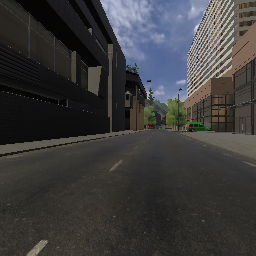

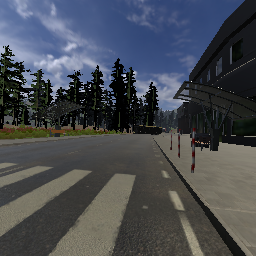

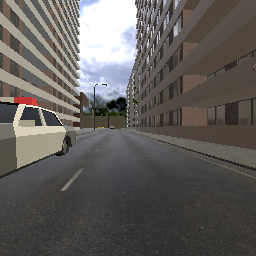

In [ ]:
test_imgs = list(test_dir.glob('inputs/*'))
test_truths = list(test_dir.glob('outputs/*'))

for image_path in test_imgs[:3]:
    display.display(Image.open(str(image_path)))

In [ ]:
BATCH_SIZE = 8
IMG_HEIGHT = 256
IMG_WIDTH = 256

In [ ]:
test_data = np.zeros((int(test_image_count/2),IMG_WIDTH,IMG_HEIGHT, 3))
test_truths_data = np.zeros((int(test_image_count/2),IMG_WIDTH,IMG_HEIGHT, 3))

test_input_entries = os.listdir('/content/test_set/inputs/')
test_output_entries = os.listdir('/content/test_set/outputs/')

test_input_entries.sort(key=lambda x: int(x.split('image_')[-1].split('.png')[0]))
test_output_entries.sort(key=lambda x: int(x.split('depth_')[-1].split('.png')[0]))

for i in range(0,math.floor(test_image_count/2)):
    test_data[i] = plt.imread('/content/test_set/inputs/' + test_input_entries[i])
    test_truths_data[i] = plt.imread('/content/test_set/outputs/' + test_output_entries[i])

In [ ]:
test_truths_data = test_truths_data[:,:,:,0]
test_truths_data = test_truths_data.reshape(test_truths_data.shape[0],test_truths_data.shape[1],test_truths_data.shape[2],1)




---



#Create model and load pre-trained weights

In [ ]:
def depth_loss_function(y_true, y_pred, theta=0.1, maxDepthVal=1000.0/10.0, err_type="SSIM"):
    if (err_type == "SSIM"):
      # Point-wise depth
      l_depth = K.mean(K.abs(y_pred - y_true), axis=-1)

      # Edges
      dy_true, dx_true = tf.image.image_gradients(y_true)
      dy_pred, dx_pred = tf.image.image_gradients(y_pred)
      l_edges = K.mean(K.abs(dy_pred - dy_true) + K.abs(dx_pred - dx_true), axis=-1)

      # Structural similarity (SSIM) index
      l_ssim = K.clip((1 - tf.image.ssim(y_true, y_pred, maxDepthVal)) * 0.5, 0, 1)

      # Weights
      w1 = 1.0
      w2 = 1.0
      w3 = theta
      return (w1 * l_ssim) + (w2 * K.mean(l_edges)) + (w3 * K.mean(l_depth))
    else:
      huber_c =  tf.reduce_max(tf.abs(y_true-y_pred),[1,2,3],True)
      huber_c = 0.2*huber_c
      x = y_true - y_pred
      diff = tf.where(tf.less_equal(tf.abs(x),huber_c),tf.abs(x),tf.multiply(tf.pow(x, 2.0)+tf.pow(huber_c, 2.0),tf.div(.5,huber_c)))

      # abs_diff = tf.abs(y_true - y_pred)
      # c = 0.2*tf.math.reduce_max(abs_diff)
      # squared_diff = tf.square(abs_diff)
      # diff = tf.where(tf.greater(abs_diff, c), (squared_diff + c * c)/(2. * c), abs_diff)
      return diff

In [ ]:
class BilinearUpSampling2D(Layer):
    def __init__(self, size=(2, 2), data_format=None, **kwargs):
        super(BilinearUpSampling2D, self).__init__(**kwargs)
        self.data_format = K.normalize_data_format(data_format)
        self.size = conv_utils.normalize_tuple(size, 2, 'size')
        self.input_spec = InputSpec(ndim=4)

    def compute_output_shape(self, input_shape):
        if self.data_format == 'channels_first':
            height = self.size[0] * input_shape[2] if input_shape[2] is not None else None
            width = self.size[1] * input_shape[3] if input_shape[3] is not None else None
            return (input_shape[0],
                    input_shape[1],
                    height,
                    width)
        elif self.data_format == 'channels_last':
            height = self.size[0] * input_shape[1] if input_shape[1] is not None else None
            width = self.size[1] * input_shape[2] if input_shape[2] is not None else None
            return (input_shape[0],
                    height,
                    width,
                    input_shape[3])

    def call(self, inputs):
        input_shape = K.shape(inputs)
        if self.data_format == 'channels_first':
            height = self.size[0] * input_shape[2] if input_shape[2] is not None else None
            width = self.size[1] * input_shape[3] if input_shape[3] is not None else None
        elif self.data_format == 'channels_last':
            height = self.size[0] * input_shape[1] if input_shape[1] is not None else None
            width = self.size[1] * input_shape[2] if input_shape[2] is not None else None
        
        return tf.image.resize_images(inputs, [height, width], method=tf.image.ResizeMethod.BILINEAR, align_corners=True)

    def get_config(self):
        config = {'size': self.size, 'data_format': self.data_format}
        base_config = super(BilinearUpSampling2D, self).get_config()
        return dict(list(base_config.items()) + list(config.items()))

In [ ]:
output_len = (IMG_HEIGHT, IMG_WIDTH)
new_base_model = applications.resnet50.ResNet50(include_top=False, weights='imagenet', input_shape=(IMG_HEIGHT,IMG_WIDTH,3))

# Starting point for decoder
base_model_output_shape = new_base_model.layers[-1].output.shape #15, 20, 2048

for layer in new_base_model.layers: layer.trainable = True

# Starting number of decoder filters
decode_filters = int(int(base_model_output_shape[-1]) / 2)

# Define upsampling layer
def upproject(tensor, filters, name, concat_with):
    up_i = BilinearUpSampling2D((2, 2), name=name + '_upsampling2d')(tensor)
    up_i = Concatenate(name=name + '_concat')(
        [up_i, new_base_model.get_layer(concat_with).output])  # Skip connection
    up_i = Conv2D(filters=filters, kernel_size=3, strides=1, padding='same', name=name + '_convA')(up_i)
    up_i = LeakyReLU(alpha=0.2)(up_i)
    up_i = Conv2D(filters=filters, kernel_size=3, strides=1, padding='same', name=name + '_convB')(up_i)
    up_i = LeakyReLU(alpha=0.2)(up_i)
    return up_i

# Decoder Layers
decoder = Conv2D(filters=decode_filters, kernel_size=1, padding='same', input_shape=base_model_output_shape,
                  name='conv2')(new_base_model.output)

decoder = upproject(decoder, int(decode_filters / 2), 'up1', concat_with='res4a_branch2a') #30, 40, 256
decoder = upproject(decoder, int(decode_filters / 4), 'up2', concat_with='res3a_branch2a') # 60, 80, 128
decoder = upproject(decoder, int(decode_filters / 8), 'up3', concat_with='max_pooling2d_1') #120,  160, 64
decoder = upproject(decoder, int(decode_filters / 16), 'up4', concat_with='activation_1')  #240, 320, 64
decoder = upproject(decoder, int(decode_filters / 32), 'up5', concat_with='input_1')

# Extract depths (final layer)
conv3 = Conv2D(filters=1, kernel_size=3, strides=1, padding='same', name='conv3')(decoder)

# Create the model
new_model = Model(inputs=new_base_model.input, outputs=conv3)

/usr/local/lib/python3.6/dist-packages/keras_applications/resnet50.py:265: UserWarning: The output shape of `ResNet50(include_top=False)` has been changed since Keras 2.2.0.
  warnings.warn('The output shape of `ResNet50(include_top=False)` '


In [ ]:
model_name = '/content/drive/My Drive/model_50.h5'
new_model.load_weights(model_name)



---



#Performance evaluation

In [ ]:
def DepthNorm(x, maxDepth):
    return maxDepth / x

# def predict(model, images, minDepth=10, maxDepth=1000, batch_size=2):
#     # Support multiple RGBs, one RGB image, even grayscale 
#     if len(images.shape) < 3: images = np.stack((images,images,images), axis=2)
#     if len(images.shape) < 4: images = images.reshape((1, images.shape[0], images.shape[1], images.shape[2]))
#     # Compute predictions
#     predictions = model.predict(images, batch_size=batch_size)
#     # Put in expected range
#     return predictions
def predict(model, images, minDepth=0.0, maxDepth=255.0, batch_size=8):
    # Support multiple RGBs, one RGB image, even grayscale 
    if len(images.shape) < 3: images = np.stack((images,images,images), axis=2)
    if len(images.shape) < 4: images = images.reshape((1, images.shape[0], images.shape[1], images.shape[2]))
    # Compute predictions
    predictions = model.predict(images, batch_size=batch_size)
    # Put in expected range
    return np.clip(DepthNorm(predictions, maxDepth=maxDepth), minDepth, maxDepth) / maxDepth

In [ ]:
#returns a tuple of (rel, rms, log10, thr(1.25), thr(1.25^2), thr(1.25^3))
def compare_images(truth_image, result_image):
    rel = calc_rel(truth_image, result_image)
    rms = calc_rms(truth_image, result_image)
    log10 = calc_log10(truth_image, result_image)
    thr_1 = calc_thr(truth_image, result_image, 1.25)
    thr_2 = calc_thr(truth_image, result_image, 1.25**2)
    thr_3 = calc_thr(truth_image, result_image, 1.25**3)
    return (thr_1, thr_2, thr_3, rel, rms, log10)


def calc_rel(truth_image, result_image):
    diff_array = (truth_image - result_image)/truth_image
    rel = np.average(abs(diff_array))
    return rel

def calc_rms(truth_image, result_image):
    diff_array = (truth_image - result_image)
    diff_array = diff_array*diff_array
    avg = np.average(diff_array)
    rms = avg**0.5
    return rms

def calc_log10(truth_image, result_image):
    log10_diff_array = (np.log10(truth_image) - np.log10(result_image))
    log10 = np.average(abs(log10_diff_array))
    return log10

def calc_thr(truth_image, result_image, thr_val):
    den = np.minimum(truth_image, result_image)
    num = np.maximum(truth_image, result_image)
    out_threshold = (num/den) > thr_val
    num_out = np.count_nonzero(out_threshold)
    num_in = truth_image.size - num_out
    thr = num_in / truth_image.size
    return thr

In [ ]:
def evaluate(model, rgb, depth, batch_size=6, verbose=False):
    N = len(rgb)

    bs = batch_size

    predictions = []
    testSetDepths = []
    
    for i in range(N//bs):    
        x = rgb[(i)*bs:(i+1)*bs,:,:,:]
        
        # Compute results
        true_y = depth[(i)*bs:(i+1)*bs,:,:,0]
        pred_y = predict(model, x, batch_size=bs)[:,:,:,0]
        
        # Test time augmentation: mirror image estimate
        # pred_y_flip = predict(model, x[...,::-1,:], batch_size=bs)[:,:,:,0]
        
        # Compute errors per image in batch
        for j in range(len(true_y)):
            # Original paper averages predictions using normal and flipped input
            # predictions.append(   (0.5 * pred_y[j]) + (0.5 * np.fliplr(pred_y_flip[j]))   )
            predictions.append(pred_y[j])
            testSetDepths.append(true_y[j])

    predictions = np.stack(predictions, axis=0)
    testSetDepths = np.stack(testSetDepths, axis=0)

    e = compare_images(predictions, testSetDepths)

    if verbose:
        print("{:>10}, {:>10}, {:>10}, {:>10}, {:>10}, {:>10}".format('a1', 'a2', 'a3', 'rel', 'rms', 'log_10'))
        print("{:10.4f}, {:10.4f}, {:10.4f}, {:10.4f}, {:10.4f}, {:10.4f}".format(e[0],e[1],e[2],e[3],e[4],e[5]))

    return e

In [ ]:
model_name = 'model_testing.h5'
new_model.load_weights(model_name)
e = evaluate(new_model, test_data, test_truths_data, batch_size=4, verbose=True)

(100, 256, 256)
        a1,         a2,         a3,        rel,        rms,     log_10
    0.9906,     0.9996,     1.0000,     0.0244,     0.0355,     0.0104


In [ ]:
model_name = 'model_shuffle_20.h5'
new_model.load_weights(model_name)
e = evaluate(new_model, test_data, test_truths_data, batch_size=4, verbose=True)

(100, 256, 256)
        a1,         a2,         a3,        rel,        rms,     log_10
    0.9926,     0.9995,     1.0000,     0.0124,     0.0288,     0.0054


In [ ]:
for i in ["1", "10", "20", "30", "40", "50"]:
  model_name = '/content/drive/My Drive/model_' + i + '.h5'
  new_model.load_weights(model_name)
  print(i + " epochs:")
  e = evaluate(new_model, test_data, test_truths_data, batch_size=10, verbose=True)

1 epochs:
        a1,         a2,         a3,        rel,        rms,     log_10
    0.9853,     0.9993,     1.0000,     0.0400,     0.0461,     0.0170
10 epochs:
        a1,         a2,         a3,        rel,        rms,     log_10
    0.9906,     0.9996,     1.0000,     0.0158,     0.0328,     0.0068
20 epochs:
        a1,         a2,         a3,        rel,        rms,     log_10
    0.9915,     0.9996,     1.0000,     0.0149,     0.0314,     0.0064
30 epochs:
        a1,         a2,         a3,        rel,        rms,     log_10
    0.9920,     0.9997,     1.0000,     0.0145,     0.0303,     0.0063
40 epochs:
        a1,         a2,         a3,        rel,        rms,     log_10
    0.9925,     0.9996,     1.0000,     0.0126,     0.0290,     0.0054
50 epochs:
        a1,         a2,         a3,        rel,        rms,     log_10
    0.9929,     0.9997,     1.0000,     0.0123,     0.0282,     0.0053




---



# Simulation data set

In [ ]:
import timeit

Starting...
600 predictions completed.
Elapsed time = 7.829413153000132 seconds


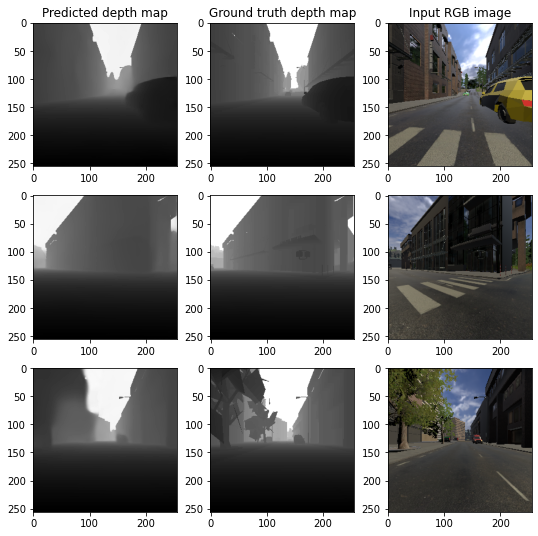

In [ ]:
print("Starting...")
start_time = timeit.default_timer()
predictions = new_model.predict(test_data, batch_size=8)
end_time = timeit.default_timer()
print(str(predictions.shape[0]) + " predictions completed.")
elapsed =  end_time - start_time
print("Elapsed time = " + str(elapsed) + " seconds")

# Display a few predictions for demonstration
new_pred = predictions[:,:,:,0]
test_size = 3
fig, ax = plt.subplots(nrows=test_size, ncols=3, figsize=(9,3*test_size))
ax[0,0].set_title('Predicted depth map')
ax[0,1].set_title('Ground truth depth map')
ax[0,2].set_title('Input RGB image')

indices = random.sample(range(0, predictions.shape[0]), 3)
for i in range(test_size):
  idx = indices[i]
  ax[i,0].imshow(new_pred[idx],cmap='gray')
  ax[i,1].imshow(test_truths_data[idx].reshape(test_truths_data.shape[1],
                                               test_truths_data.shape[2]),
                                               cmap="gray")
  ax[i,2].imshow(test_data[idx])

plt.show()

In [ ]:
new_pred = predictions[:,:,:,0]

In [ ]:
# predictions = new_model.predict(test_data, batch_size=32)
# new_pred = predictions.reshape(predictions.shape[0],predictions.shape[1], predictions.shape[2])
# print(new_pred.shape)

In [ ]:
test_size = predictions.shape[0]
fig, ax = plt.subplots(nrows=test_size, ncols=3, figsize=(15,5*test_size))
for i in range(test_size):
  ax[i,0].imshow(new_pred[i],cmap='gray')
  ax[i,1].imshow(test_truths_data[i].reshape(test_truths_data.shape[1],test_truths_data.shape[2]),cmap="gray")
  ax[i,2].imshow(test_data[i])
plt.savefig ("results.pdf")
plt.close()
# plt.show()

###Trained for 10 epochs with policy

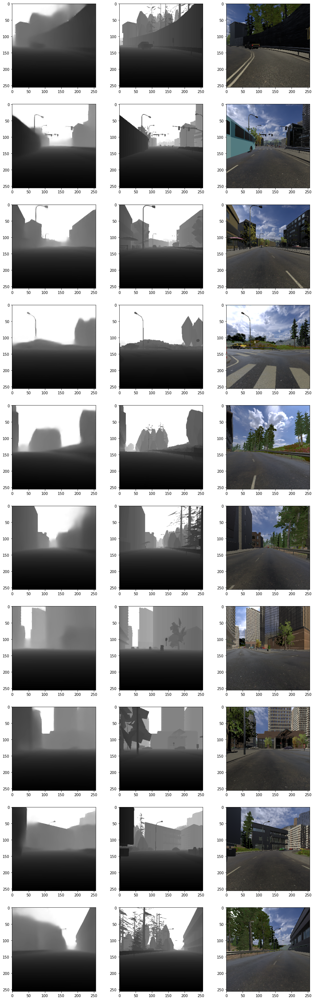

In [ ]:
# test_size = new_pred.shape[0]
test_size = 10
fig, ax = plt.subplots(nrows=test_size, ncols=3, figsize=(15,5*test_size))
for i in range(test_size):
  ax[i,0].imshow(new_pred[i],cmap='gray')
  ax[i,1].imshow(test_truths_data[i].reshape(test_truths_data.shape[1],test_truths_data.shape[2]),cmap="gray")
  ax[i,2].imshow(test_data[i])

plt.show()

###Trained for 50 epochs

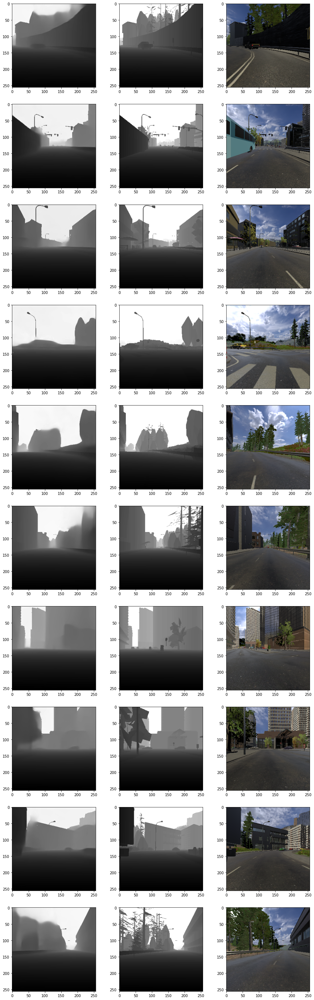

In [ ]:
# test_size = new_pred.shape[0]
test_size = 10
fig, ax = plt.subplots(nrows=test_size, ncols=3, figsize=(15,5*test_size))
for i in range(test_size):
  ax[i,0].imshow(new_pred[i],cmap='gray')
  ax[i,1].imshow(test_truths_data[i].reshape(test_truths_data.shape[1],test_truths_data.shape[2]),cmap="gray")
  ax[i,2].imshow(test_data[i])

plt.show()

###Trained for 40 epochs

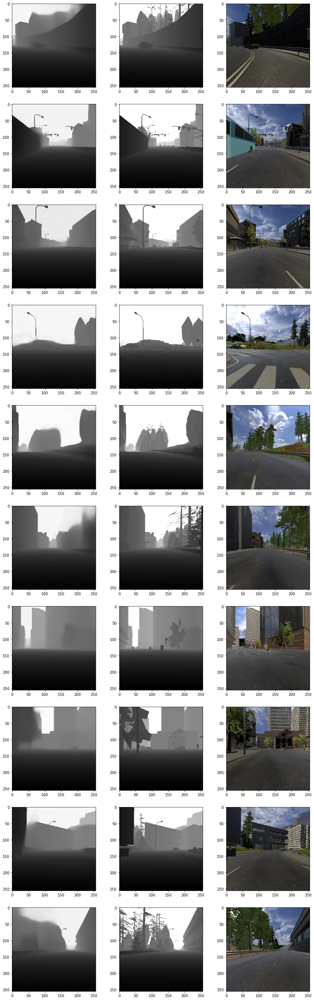

In [ ]:
# test_size = new_pred.shape[0]
test_size = 10
fig, ax = plt.subplots(nrows=test_size, ncols=3, figsize=(15,5*test_size))
for i in range(test_size):
  ax[i,0].imshow(new_pred[i],cmap='gray')
  ax[i,1].imshow(test_truths_data[i].reshape(test_truths_data.shape[1],test_truths_data.shape[2]),cmap="gray")
  ax[i,2].imshow(test_data[i])

plt.show()

###Trained for 30 epochs

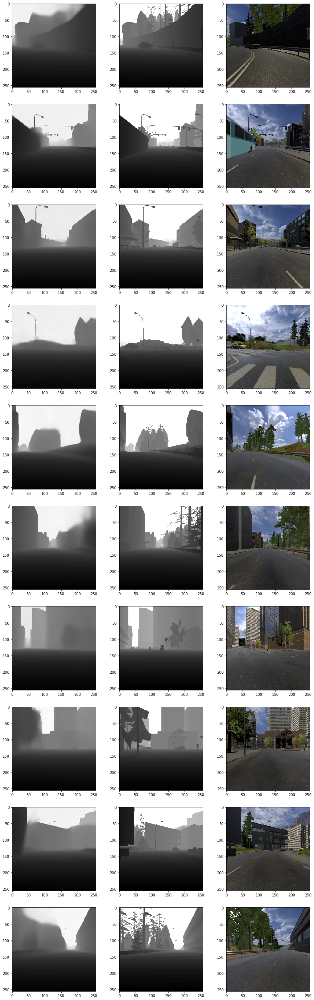

In [ ]:
# test_size = new_pred.shape[0]
test_size = 10
fig, ax = plt.subplots(nrows=test_size, ncols=3, figsize=(15,5*test_size))
for i in range(test_size):
  ax[i,0].imshow(new_pred[i],cmap='gray')
  ax[i,1].imshow(test_truths_data[i].reshape(test_truths_data.shape[1],test_truths_data.shape[2]),cmap="gray")
  ax[i,2].imshow(test_data[i])

plt.show()

###Trained for 20 epochs

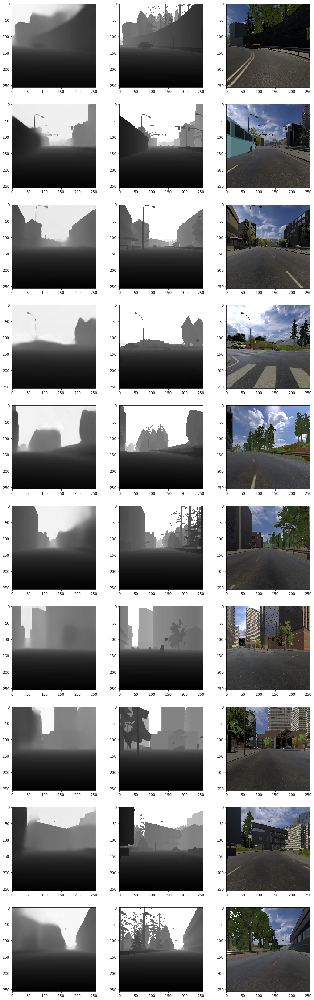

In [ ]:
# test_size = new_pred.shape[0]
test_size = 10
fig, ax = plt.subplots(nrows=test_size, ncols=3, figsize=(15,5*test_size))
for i in range(test_size):
  ax[i,0].imshow(new_pred[i],cmap='gray')
  ax[i,1].imshow(test_truths_data[i].reshape(test_truths_data.shape[1],test_truths_data.shape[2]),cmap="gray")
  ax[i,2].imshow(test_data[i])

plt.show()

###Trained for 10 epochs

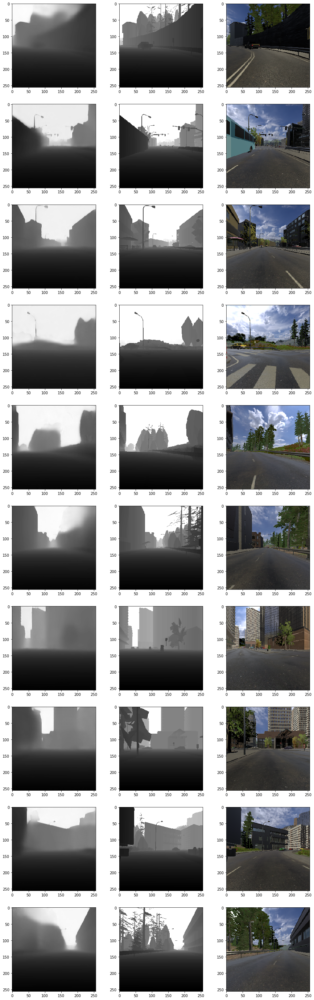

In [ ]:
# test_size = new_pred.shape[0]
test_size = 10
fig, ax = plt.subplots(nrows=test_size, ncols=3, figsize=(15,5*test_size))
for i in range(test_size):
  ax[i,0].imshow(new_pred[i],cmap='gray')
  ax[i,1].imshow(test_truths_data[i].reshape(test_truths_data.shape[1],test_truths_data.shape[2]),cmap="gray")
  ax[i,2].imshow(test_data[i])

plt.show()

###Trained for 1 epoch

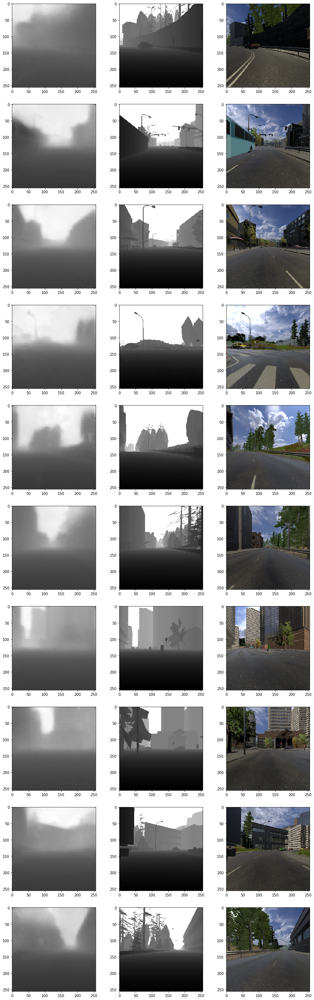

In [ ]:
# test_size = new_pred.shape[0]
test_size = 10
fig, ax = plt.subplots(nrows=test_size, ncols=3, figsize=(15,5*test_size))
for i in range(test_size):
  ax[i,0].imshow(new_pred[i],cmap='gray')
  ax[i,1].imshow(test_truths_data[i].reshape(test_truths_data.shape[1],test_truths_data.shape[2]),cmap="gray")
  ax[i,2].imshow(test_data[i])

plt.show()



---



# Kitti data set

In [ ]:
kitti_img_rgb4_1 = plt.imread('rgb_04_000010.png')
kitti_img_rgb4_2 = plt.imread('rgb_06_000026.png')

In [ ]:
kitti_img_rgb3_1 = kitti_img_rgb4_1[:,:,0:3]
kitti_img_rgb3_2 = kitti_img_rgb4_2[:,:,0:3]

In [ ]:
kitti_imgs = []
kitti_imgs.append(kitti_img_rgb3_1)
kitti_imgs.append(kitti_img_rgb3_2)

kitti_imgs = np.array(kitti_imgs)
kitti_imgs.shape

(2, 256, 256, 3)

In [ ]:
kitti_predictions = new_model.predict(kitti_imgs, batch_size=32)
formatted_kitti_pred = kitti_predictions.reshape(kitti_predictions.shape[0],kitti_predictions.shape[1], kitti_predictions.shape[2])
print(formatted_kitti_pred.shape)

(2, 256, 256)


###Trained for 50 epochs

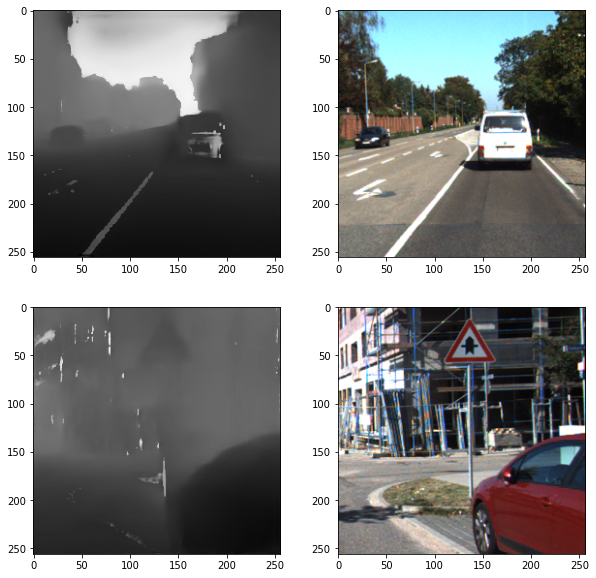

In [ ]:
kitti_size = formatted_kitti_pred.shape[0]
fig, ax = plt.subplots(nrows=kitti_size, ncols=2, figsize=(10,5*kitti_size))
for i in range(kitti_size):
  ax[i,0].imshow(formatted_kitti_pred[i],cmap='gray')
  ax[i,1].imshow(kitti_imgs[i])

plt.show()

###Trained for 40 epochs

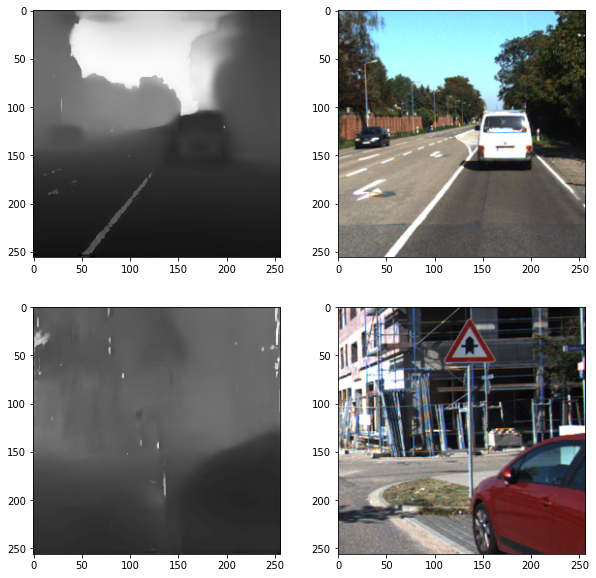

In [ ]:
kitti_size = formatted_kitti_pred.shape[0]
fig, ax = plt.subplots(nrows=kitti_size, ncols=2, figsize=(10,5*kitti_size))
for i in range(kitti_size):
  ax[i,0].imshow(formatted_kitti_pred[i],cmap='gray')
  ax[i,1].imshow(kitti_imgs[i])

plt.show()

###Trained for 30 epochs

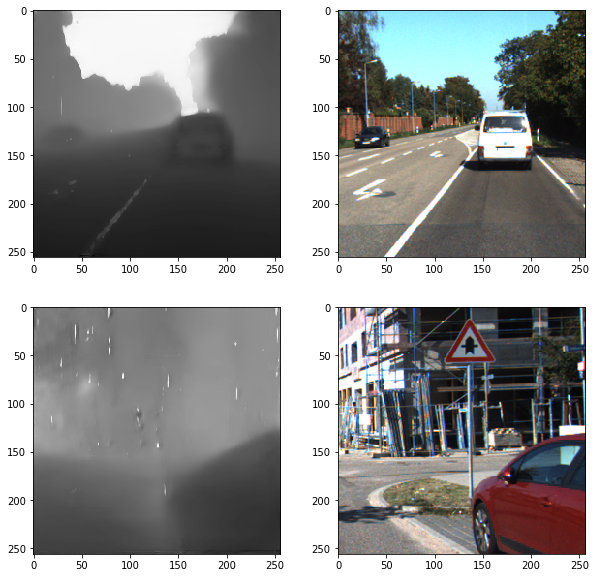

In [ ]:
kitti_size = formatted_kitti_pred.shape[0]
fig, ax = plt.subplots(nrows=kitti_size, ncols=2, figsize=(10,5*kitti_size))
for i in range(kitti_size):
  ax[i,0].imshow(formatted_kitti_pred[i],cmap='gray')
  ax[i,1].imshow(kitti_imgs[i])

plt.show()

###Trained for 20 epochs

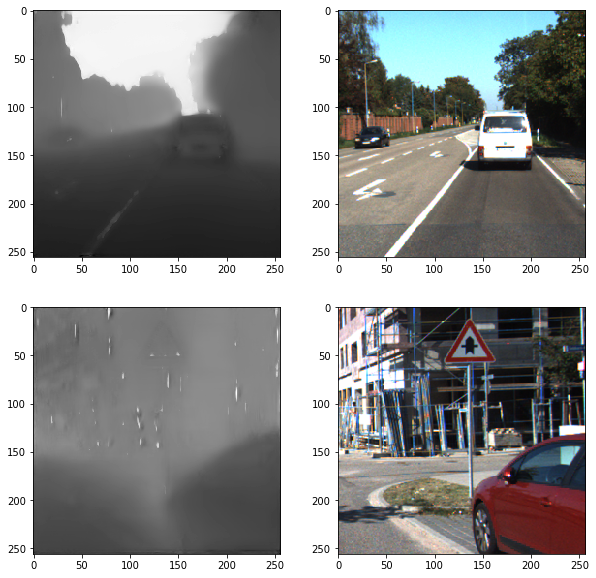

In [ ]:
kitti_size = formatted_kitti_pred.shape[0]
fig, ax = plt.subplots(nrows=kitti_size, ncols=2, figsize=(10,5*kitti_size))
for i in range(kitti_size):
  ax[i,0].imshow(formatted_kitti_pred[i],cmap='gray')
  ax[i,1].imshow(kitti_imgs[i])

plt.show()

###Trained for 10 epochs

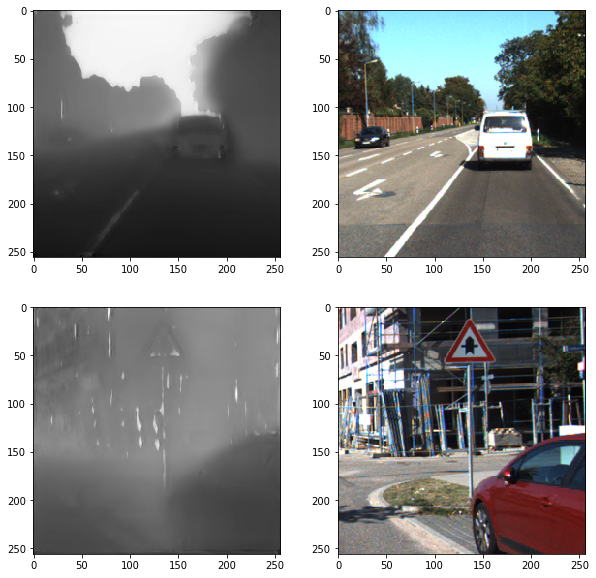

In [ ]:
kitti_size = formatted_kitti_pred.shape[0]
fig, ax = plt.subplots(nrows=kitti_size, ncols=2, figsize=(10,5*kitti_size))
for i in range(kitti_size):
  ax[i,0].imshow(formatted_kitti_pred[i],cmap='gray')
  ax[i,1].imshow(kitti_imgs[i])

plt.show()

###Trained for 1 epoch

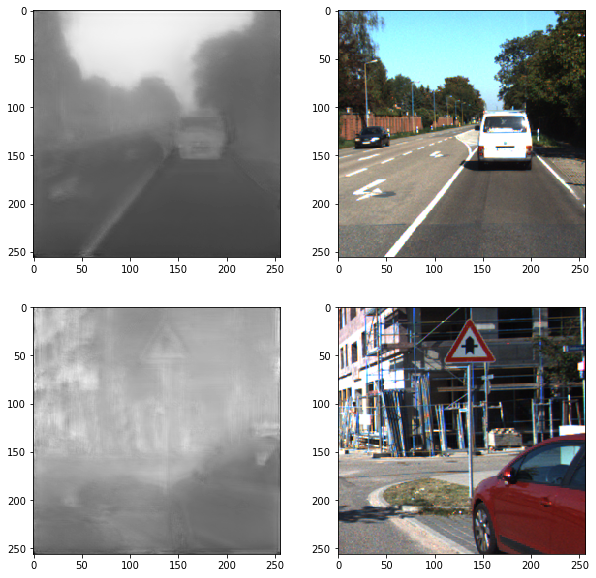

In [ ]:
kitti_size = formatted_kitti_pred.shape[0]
fig, ax = plt.subplots(nrows=kitti_size, ncols=2, figsize=(10,5*kitti_size))
for i in range(kitti_size):
  ax[i,0].imshow(formatted_kitti_pred[i],cmap='gray')
  ax[i,1].imshow(kitti_imgs[i])

plt.show()